In [ ]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
import os
import json
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving swagat_dry.zip to swagat_dry.zip


In [ ]:
!unzip -qq /content/swagat_dry.zip

In [ ]:
# Paths to the images and polygon annotations
images_path = '/content/swagat_dry/images/'
polygons_path = '/content/swagat_dry/polygons/'

# Output path to store the results
output_path = '/content/output_masks/'
os.makedirs(output_path, exist_ok=True)

In [ ]:
def load_images_and_masks(images_path, polygons_path):
    images = []
    masks = []

    # List all image files
    image_files = sorted([f for f in os.listdir(images_path) if f.endswith('.png')])

    for img_file in image_files:
        # Read image
        img = cv2.imread(os.path.join(images_path, img_file))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Load corresponding polygon mask from JSON
        json_file = os.path.join(polygons_path, img_file.replace('.png', '.json'))
        with open(json_file, 'r') as f:
            polygons = json.load(f)

        # Create a blank mask
        mask = np.zeros(img.shape[:2], dtype=np.uint8)

        # Draw polygons on the mask
        for annotation in polygons['annotations']:
            points = np.array(annotation['segmentation'][0], dtype=np.int32).reshape(-1, 2)
            cv2.fillPoly(mask, [points], color=255)  # '255' for white color in mask

        # Resize the images and masks if needed
        img = cv2.resize(img, (256, 256))  # Resize to 256x256
        mask = cv2.resize(mask, (256, 256))

        # Normalize the images and masks
        img = img / 255.0
        mask = mask / 255.0

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

# Load images and masks
images, masks = load_images_and_masks(images_path, polygons_path)
print(f'Loaded {len(images)} images and masks.')

Loaded 50 images and masks.


In [ ]:
def unet_model(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bottleneck
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)

    # Decoder
    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv4], axis=-1)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(up6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=-1)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(up7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=-1)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(up8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=-1)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(up9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)

    model = Model(inputs=[inputs], outputs=[outputs])

    #model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    #model.compile(optimizer='sgd', loss='binary_crossentropy', metrics=['accuracy'])
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Example usage
model = unet_model()
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_19 (Conv2D)        │ (None, 256, 256, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_20 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ conv2d_19[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 128, 128, 64)   │              0 │ conv2d_20[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_21 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ conv2d_21[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 64, 64, 128)    │              0 │ conv2d_22[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_23 (Conv2D)        │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_24 (Conv2D)        │ (None, 64, 64, 256)    │        590,080 │ conv2d_23[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 32, 32, 256)    │              0 │ conv2d_24[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_25 (Conv2D)        │ (None, 32, 32, 512)    │      1,180,160 │ max_pooling2d_6[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_26 (Conv2D)        │ (None, 32, 32, 512)    │      2,359,808 │ conv2d_25[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_7           │ (None, 16, 16, 512)    │              0 │ conv2d_26[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_27 (Conv2D)        │ (None, 16, 16, 1024)   │      4,719,616 │ max_pooling2d_7[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_28 (Conv2D)        │ (None, 16, 16, 1024)   │      9,438,208 │ conv2d_27[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_4           │ (None, 32, 32, 1024)   │              0 │ conv2d_28[0][0]        │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_4        

 Total params: 31,378,945 (119.70 MB)

 Trainable params: 31,378,945 (119.70 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(images, masks, test_size=0.2, random_state=42)

# Train the model
history = model.fit(X_train, y_train, epochs=20, batch_size=8, validation_data=(X_val, y_val))

Epoch 1/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 789ms/step - accuracy: 0.2456 - loss: 0.7058 - val_accuracy: 0.8447 - val_loss: 0.6807
Epoch 2/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - accuracy: 0.8419 - loss: 0.6514 - val_accuracy: 0.8490 - val_loss: 0.4740
Epoch 3/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 231ms/step - accuracy: 0.8383 - loss: 0.5014 - val_accuracy: 0.8490 - val_loss: 0.5043
Epoch 4/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - accuracy: 0.8399 - loss: 0.4739 - val_accuracy: 0.8490 - val_loss: 0.4476
Epoch 5/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - accuracy: 0.8463 - loss: 0.4216 - val_accuracy: 0.8490 - val_loss: 0.4173
Epoch 6/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - accuracy: 0.8444 - loss: 0.3959 - val_accuracy: 0.8490 - val_loss: 0.3711
Epoch 7/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 233ms/step - accuracy: 0.8468 - loss: 0.3408 - val_accuracy: 0.8490 - val_loss: 0.3349
Epoch 8/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 234ms/step - accuracy: 0.8434 - loss: 0.2919 - val_accuracy: 0.8490 - val_loss

In [ ]:
# Train Accuracy
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f'Train Accuracy: {train_accuracy * 100:.2f}%')

2/2 ━━━━━━━━━━━━━━━━━━━━ 30s 68ms/step - accuracy: 1.0000 - loss: 1.1921e-07
Train Accuracy: 100.00%


In [ ]:
# Validation Accuracy
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step - accuracy: 1.0000 - loss: 1.1921e-07
Validation Accuracy: 100.00%


In [ ]:
def apply_mask(image, mask):
    # Convert mask to 3-channel image
    mask_rgb = np.stack((mask,)*3, axis=-1)

    # White color for the road (BGR format)
    white = [255, 255, 255]

    # Apply the mask with deep yellow color
    masked_image = np.where(mask_rgb > 0.5, white, image)

    return masked_image

def process_and_save(images, output_path, model):
       for idx, img in enumerate(images):
           start_time = time.time()

           # Predict the mask
           mask = model.predict(np.expand_dims(img, axis=0))[0]
           mask = (mask > 0.5).astype(np.uint8)

           # Save the original and mask images
           original_img = img * 255
           cv2.imwrite(f'{output_path}/original_{idx}.png', original_img)
           cv2.imwrite(f'{output_path}/mask_{idx}.png', mask * 255)

           # Print processing time
           processing_time = time.time() - start_time
           print(f'Processed image {idx + 1} in {processing_time:.2f} seconds.')

# Process and save the output
process_and_save(images, output_path, model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 689ms/step
Processed image 1 in 0.74 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Processed image 2 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Processed image 3 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Processed image 4 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Processed image 5 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Processed image 6 in 0.08 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Processed image 7 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Processed image 8 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Processed image 9 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Processed image 10 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Processed image 11 in 0.08 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Processed image 12 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Processed image 13 in 0.07 seconds.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Processe

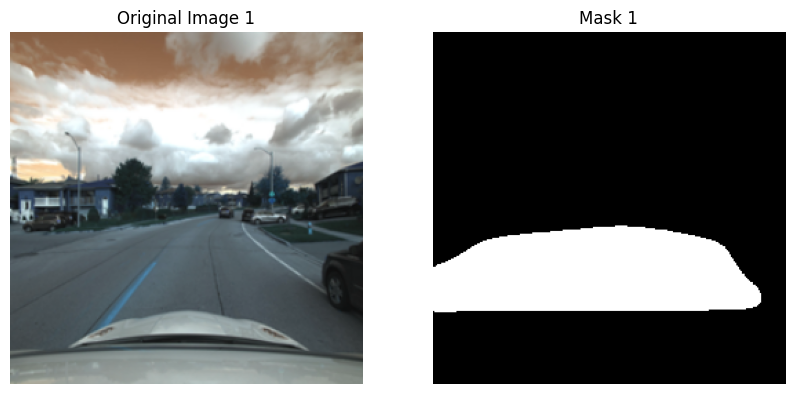

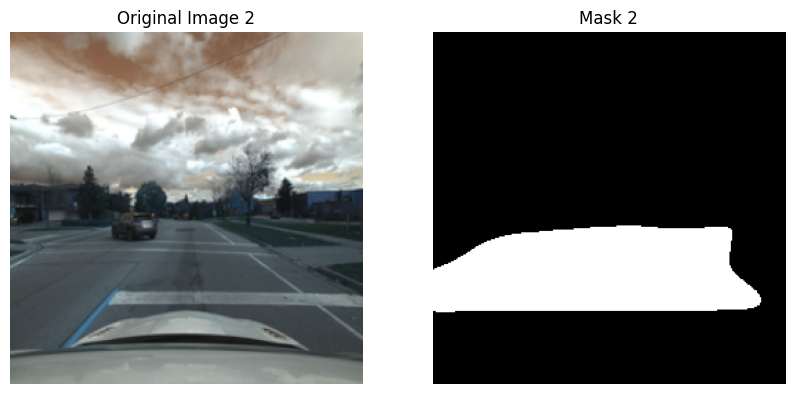

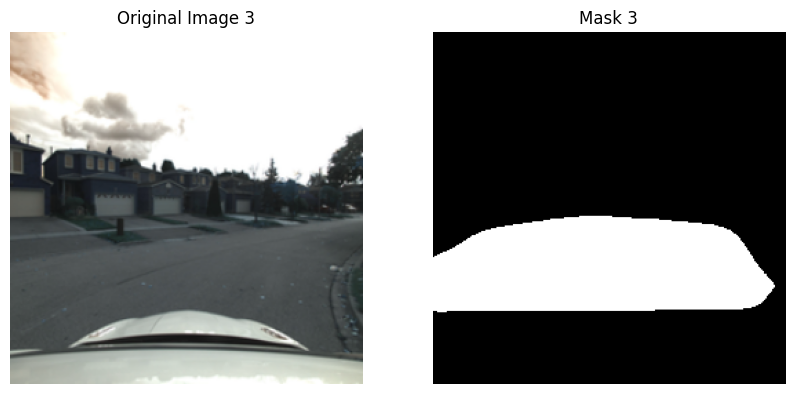

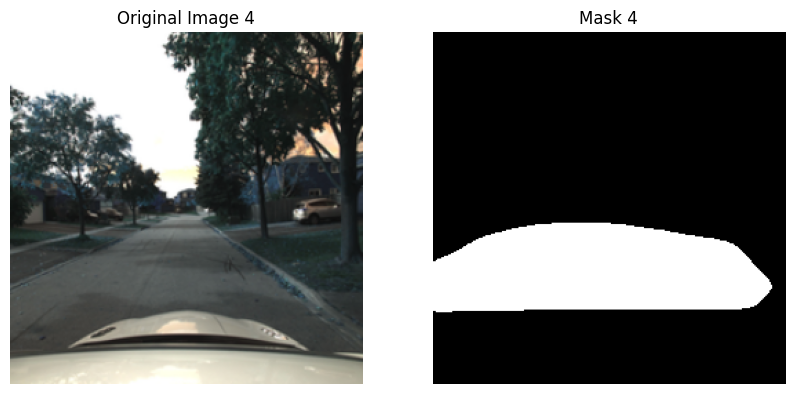

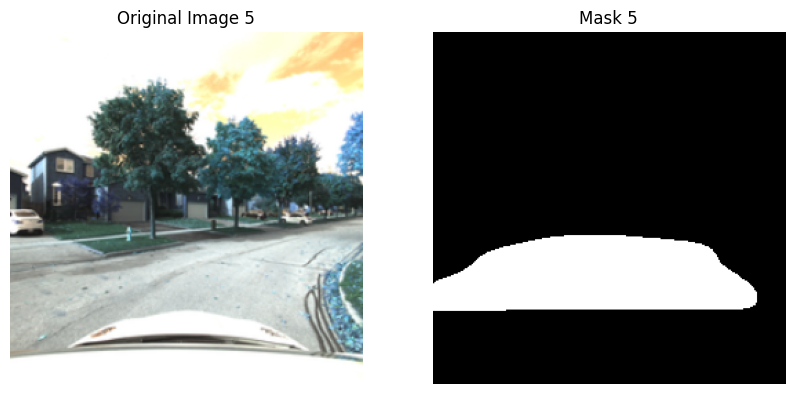

...

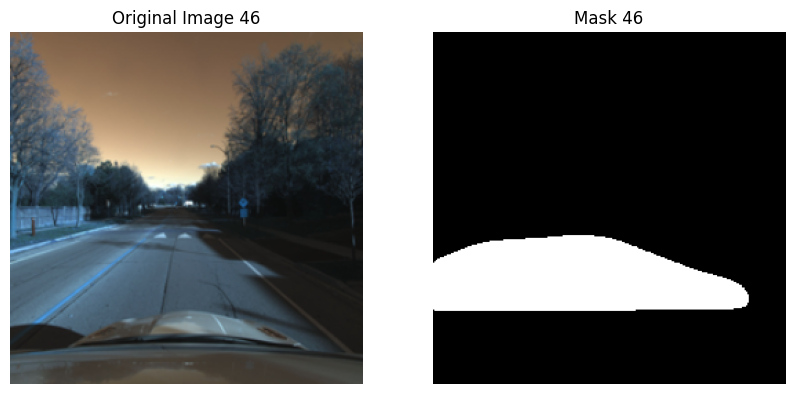

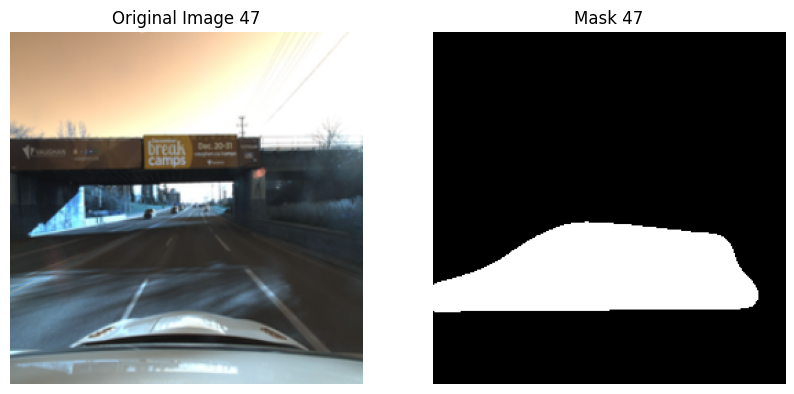

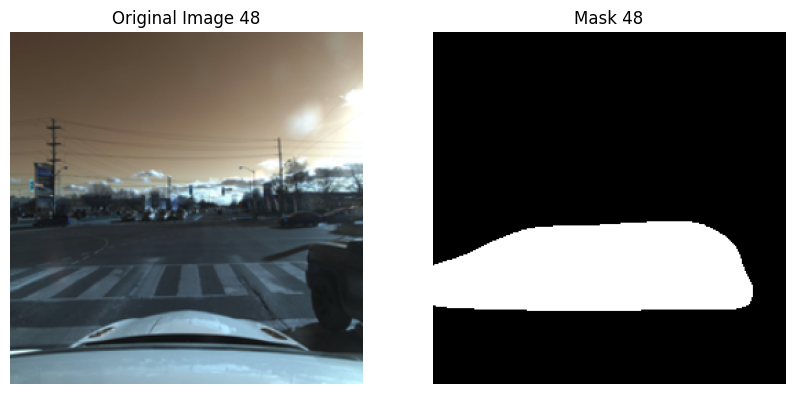

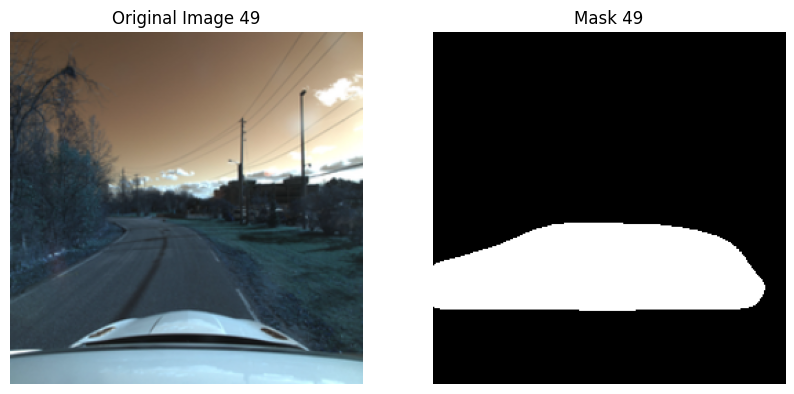

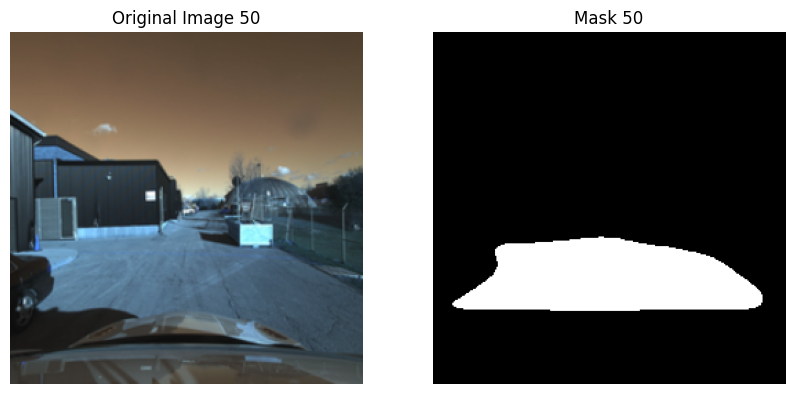

In [ ]:
def visualize_all_results(output_path):
       # List all the images in the output folder
       image_files = sorted([f for f in os.listdir(output_path) if 'original' in f])

       for idx in range(len(image_files)):
           # Paths for the original image and mask
           original_path = os.path.join(output_path, f'original_{idx}.png')
           mask_path = os.path.join(output_path, f'mask_{idx}.png')

           # Read the images
           original = cv2.imread(original_path)
           mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

           # Plot the images side by side
           fig, axs = plt.subplots(1, 2, figsize=(10, 5))
           axs[0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
           axs[0].set_title(f'Original Image {idx + 1}')
           axs[1].imshow(mask, cmap='gray')
           axs[1].set_title(f'Mask {idx + 1}')

           # Remove axis
           for ax in axs:
               ax.axis('off')

           plt.show()

# Visualize all results
visualize_all_results(output_path)